### Temperature Forecast Project using ML
### Problem Statement:
### Data Set Information:

This data is for the purpose of bias correction of next-day maximum and minimum air temperatures forecast of the LDAPS model operated by the Korea Meteorological Administration over Seoul, South Korea. This data consists of summer data from 2013 to 2017. The input data is largely composed of the LDAPS model's next-day forecast data, in-situ maximum and minimum temperatures of present-day, and geographic auxiliary variables. There are two outputs (i.e. next-day maximum and minimum air temperatures) in this data. Hindcast validation was conducted for the period from 2015 to 2017.


Attribute Information:

For more information, read [Cho et al, 2020].
1. station - used weather station number: 1 to 25
2. Date - Present day: yyyy-mm-dd ('2013-06-30' to '2017-08-30')
3. Present_Tmax - Maximum air temperature between 0 and 21 h on the present day (Â°C): 20 to 37.6
4. Present_Tmin - Minimum air temperature between 0 and 21 h on the present day (Â°C): 11.3 to 29.9
5. LDAPS_RHmin - LDAPS model forecast of next-day minimum relative humidity (%): 19.8 to 98.5
6. LDAPS_RHmax - LDAPS model forecast of next-day maximum relative humidity (%): 58.9 to 100
7. LDAPS_Tmax_lapse - LDAPS model forecast of next-day maximum air temperature applied lapse rate (Â°C): 17.6 to 38.5
8. LDAPS_Tmin_lapse - LDAPS model forecast of next-day minimum air temperature applied lapse rate (Â°C): 14.3 to 29.6
9. LDAPS_WS - LDAPS model forecast of next-day average wind speed (m/s): 2.9 to 21.9
10. LDAPS_LH - LDAPS model forecast of next-day average latent heat flux (W/m2): -13.6 to 213.4
11. LDAPS_CC1 - LDAPS model forecast of next-day 1st 6-hour split average cloud cover (0-5 h) (%): 0 to 0.97
12. LDAPS_CC2 - LDAPS model forecast of next-day 2nd 6-hour split average cloud cover (6-11 h) (%): 0 to 0.97
13. LDAPS_CC3 - LDAPS model forecast of next-day 3rd 6-hour split average cloud cover (12-17 h) (%): 0 to 0.98
14. LDAPS_CC4 - LDAPS model forecast of next-day 4th 6-hour split average cloud cover (18-23 h) (%): 0 to 0.97
15. LDAPS_PPT1 - LDAPS model forecast of next-day 1st 6-hour split average precipitation (0-5 h) (%): 0 to 23.7
16. LDAPS_PPT2 - LDAPS model forecast of next-day 2nd 6-hour split average precipitation (6-11 h) (%): 0 to 21.6
17. LDAPS_PPT3 - LDAPS model forecast of next-day 3rd 6-hour split average precipitation (12-17 h) (%): 0 to 15.8
18. LDAPS_PPT4 - LDAPS model forecast of next-day 4th 6-hour split average precipitation (18-23 h) (%): 0 to 16.7
19. lat - Latitude (Â°): 37.456 to 37.645
20. lon - Longitude (Â°): 126.826 to 127.135
21. DEM - Elevation (m): 12.4 to 212.3
22. Slope - Slope (Â°): 0.1 to 5.2
23. Solar radiation - Daily incoming solar radiation (wh/m2): 4329.5 to 5992.9
24. Next_Tmax - The next-day maximum air temperature (Â°C): 17.4 to 38.9
25. Next_Tmin - The next-day minimum air temperature (Â°C): 11.3 to 29.8T

Please note that there are two target variables here: 

1) Next_Tmax: Next day maximum temperature

2) Next_Tmin: Next day  minimum temperature

##### LDAPS - local data assimilation and prediction system .

##### Hindcasting - 
Also, since surface waves represent a forced system where the wind is the only generating force, wave hindcasting is often considered adequate for generating a reasonable representation of the wave climate with little need for a full reanalysis. Hindcasting is also used in hydrology for model stream flows

##### Lapse rate
lapse rate is rate of change in temperature observed while moving upward through the Earth’s atmosphere (troposphere to be specific). The lapse rate is considered positive when the temperature decreases with elevation, zero when the temperature is constant with elevation, and negative when the temperature increases with elevation (temperature inversion) .

##### Latent heat flux
In meteorology, latent heat flux is the flux of energy from the Earth's surface to the atmosphere that is associated with evaporation or transpiration of water at the surface and subsequent condensation of water vapor in the troposphere. It is an important component of Earth's surface energy budget.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

In [2]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

In [3]:
data = pd.read_csv("temperature.csv")
data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [4]:
data.shape

(7752, 25)

In [5]:
data.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [6]:
data['Date']

0       30-06-2013
1       30-06-2013
2       30-06-2013
3       30-06-2013
4       30-06-2013
5       30-06-2013
6       30-06-2013
7       30-06-2013
8       30-06-2013
9       30-06-2013
10      30-06-2013
11      30-06-2013
12      30-06-2013
13      30-06-2013
14      30-06-2013
15      30-06-2013
16      30-06-2013
17      30-06-2013
18      30-06-2013
19      30-06-2013
20      30-06-2013
21      30-06-2013
22      30-06-2013
23      30-06-2013
24      30-06-2013
25      01-07-2013
26      01-07-2013
27      01-07-2013
28      01-07-2013
29      01-07-2013
30      01-07-2013
31      01-07-2013
32      01-07-2013
33      01-07-2013
34      01-07-2013
35      01-07-2013
36      01-07-2013
37      01-07-2013
38      01-07-2013
39      01-07-2013
40      01-07-2013
41      01-07-2013
42      01-07-2013
43      01-07-2013
44      01-07-2013
45      01-07-2013
46      01-07-2013
47      01-07-2013
48      01-07-2013
49      01-07-2013
50      02-07-2013
51      02-07-2013
52      02-0

In [7]:
data.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [8]:
data.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [9]:
data = data.dropna() #All null values are dropped as we have good amount of data to be treated 

In [10]:
data.isnull().sum().sum()

0

In [11]:
data.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

### Feature engineering

In [12]:
### Converting date

In [13]:
data.sample(5)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
6349,25.0,05-07-2017,32.9,24.0,41.892845,80.050484,34.797159,25.240481,7.060403,37.035279,0.013363,0.013559,0.217960,0.305550,0.000000,0.000000,4.430923,0.006060,37.5237,126.970,19.5844,0.2713,5822.532715,34.9,23.7
6555,6.0,14-07-2017,32.4,26.4,67.949348,89.695610,29.818682,24.014697,7.183775,77.610320,0.717916,0.547037,0.460501,0.319774,3.724947,0.185899,0.000000,0.000000,37.5102,127.042,54.6384,0.1457,5744.228027,27.0,22.8
3200,1.0,04-07-2015,26.1,16.1,40.337231,80.949455,27.317078,18.954214,7.785833,76.539369,0.267611,0.161784,0.064467,0.124365,0.000000,0.000000,0.000995,0.000000,37.6046,126.991,212.3350,2.7850,5968.809082,25.9,17.6
3350,1.0,10-07-2015,29.6,20.9,46.207649,85.538849,33.360508,24.563467,6.699068,73.583621,0.056634,0.123283,0.434910,0.320541,0.000000,0.000000,0.000000,0.003862,37.6046,126.991,212.3350,2.7850,5915.583496,33.0,23.5
1548,24.0,30-08-2013,28.5,23.9,43.959099,81.970146,28.041749,21.617186,7.888563,49.817869,0.210984,0.242769,0.167795,0.225992,0.000000,0.000000,0.000000,0.001479,37.5237,126.909,17.2956,0.2223,4438.373535,29.1,21.7


### EDA

In [14]:
data.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.113301,0.133282,-0.067846,-0.169351,0.069856,0.105277,0.005822,-0.132129,0.006539,0.003526,-0.000161,0.005005,-0.001954,-0.007635,-0.013865,-0.011085,-0.239118,-0.118845,-0.256706,-0.091721,-0.021194,0.107747,0.128184
Present_Tmax,0.113301,1.000000,0.615208,-0.209059,-0.306943,0.573777,0.628705,-0.125952,0.134246,-0.316333,-0.216976,-0.146391,-0.143069,-0.114917,-0.104779,-0.127248,-0.107295,-0.054134,0.007695,-0.189439,-0.107079,-0.022114,0.610357,0.621048
Present_Tmin,0.133282,0.615208,1.000000,0.122200,-0.018576,0.467904,0.772061,-0.038779,-0.012817,0.084348,0.090038,-0.004719,-0.046694,0.111577,0.066207,-0.052428,-0.070391,-0.081417,-0.045174,-0.254084,-0.148423,0.059765,0.463523,0.796975
LDAPS_RHmin,-0.067846,-0.209059,0.122200,1.000000,0.578358,-0.569580,0.085237,0.289422,-0.072195,0.612831,0.744774,0.688069,0.513937,0.259039,0.389572,0.237512,0.167311,0.085027,-0.077590,0.100684,0.122454,0.242168,-0.446824,0.093249
LDAPS_RHmax,-0.169351,-0.306943,-0.018576,0.578358,1.000000,-0.377293,-0.118965,0.131269,0.238986,0.435937,0.390620,0.224734,0.127242,0.268019,0.227581,0.132436,0.118101,0.194820,0.025563,0.176557,0.219436,0.146622,-0.289788,-0.076415
LDAPS_Tmax_lapse,0.069856,0.573777,0.467904,-0.569580,-0.377293,1.000000,0.653425,-0.316011,0.043663,-0.440878,-0.525380,-0.542728,-0.429739,-0.115659,-0.248369,-0.193749,-0.170415,-0.044052,0.091568,-0.181433,-0.163891,0.047414,0.835729,0.589963
LDAPS_Tmin_lapse,0.105277,0.628705,0.772061,0.085237,-0.118965,0.653425,1.000000,-0.134652,-0.139675,0.008714,0.046537,-0.044998,-0.079536,0.034956,-0.002743,-0.093116,-0.103541,-0.099452,-0.024703,-0.198396,-0.187864,0.157763,0.592119,0.886513
LDAPS_WS,0.005822,-0.125952,-0.038779,0.289422,0.131269,-0.316011,-0.134652,1.000000,0.004427,0.285349,0.257226,0.238155,0.218870,0.141503,0.181634,0.147199,0.134428,0.033025,-0.063009,0.188540,0.169223,0.120630,-0.351107,-0.102021
LDAPS_LH,-0.132129,0.134246,-0.012817,-0.072195,0.238986,0.043663,-0.139675,0.004427,1.000000,-0.148314,-0.265382,-0.246709,-0.173156,-0.018708,-0.084375,0.009495,0.012372,0.133309,0.024476,0.056362,0.087517,-0.044956,0.156779,-0.060392
LDAPS_CC1,0.006539,-0.316333,0.084348,0.612831,0.435937,-0.440878,0.008714,0.285349,-0.148314,1.000000,0.779510,0.516698,0.362670,0.446930,0.389368,0.166763,0.088897,-0.010268,-0.007962,-0.017378,-0.023893,0.218285,-0.459705,-0.012877


### Heatmap

<AxesSubplot:>

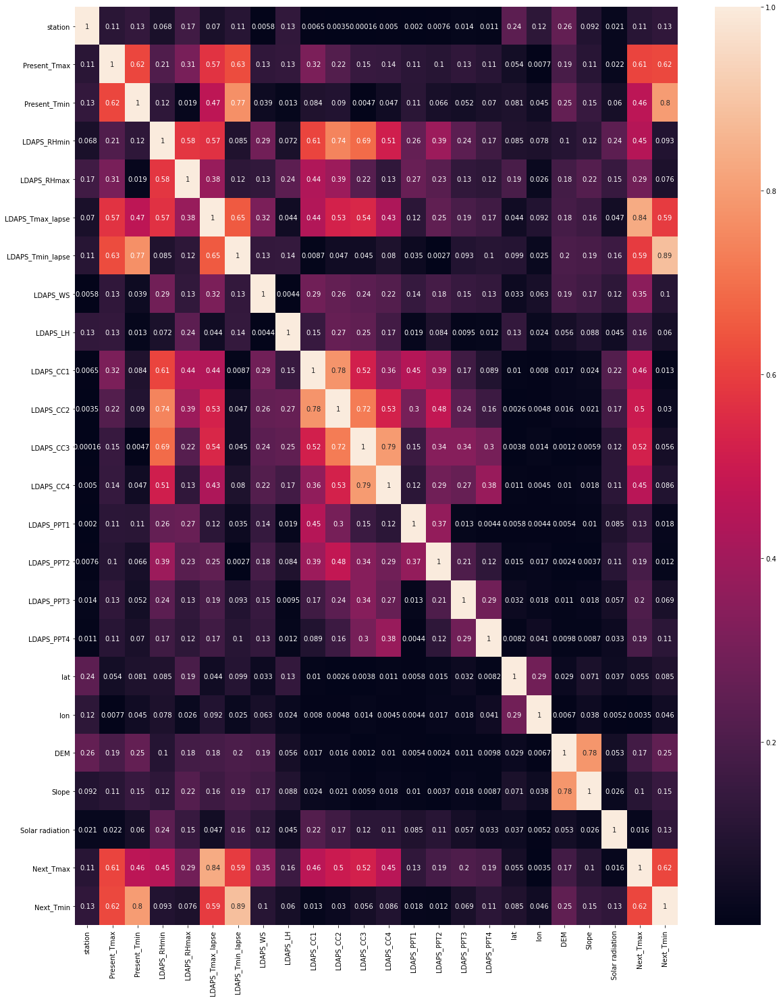

In [15]:
plt.figure(figsize=(20,25))
sns.heatmap(abs(data.corr()),annot=True)

#### There are can be multi colinearity in soo many columns soo we will check it by vif value

### Date column - dropped

In [16]:
data = data.drop(columns=['Date'],axis=1)

In [17]:
import reverse_geocoder as rg
import pprint
data00=[]
def reverseGeocode(coordinates):
    result=rg.search(coordinates)
    return(result)
if __name__=="__main__":
    coordinates=list(zip(data['lat'],data['lon']))
    data12=reverseGeocode(coordinates)
    data00.append(data12)

new_data=pd.DataFrame(data00).transpose()

Loading formatted geocoded file...


In [18]:
data['state']=new_data[0].apply(lambda x:x.get('admin1'))

data['Country']=new_data[0].apply(lambda x:x.get('cc'))

In [19]:
data.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,state,Country
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,0.203896,0.161697,0.130928,0.0,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,Seoul,KR
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,0.251771,0.159444,0.127727,0.0,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,Seoul,KR
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,0.257469,0.204091,0.142125,0.0,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,Seoul,KR
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,0.226002,0.161157,0.134249,0.0,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,Seoul,KR
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,0.249995,0.178892,0.170021,0.0,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,Gyeonggi-do,KR


In [20]:
import warnings
warnings.filterwarnings('ignore')

### Encoding and cleaning after seeing corelation

In [21]:
data = data.drop(columns=['lat','lon',],axis=1)

In [22]:
from sklearn.preprocessing import LabelEncoder
lab_enc = LabelEncoder()
data['state'] = lab_enc.fit_transform(data['state'])
data['Country'] = lab_enc.fit_transform(data['Country'])

### Data distribution(bar graph)

In [23]:
data.shape

(7588, 24)

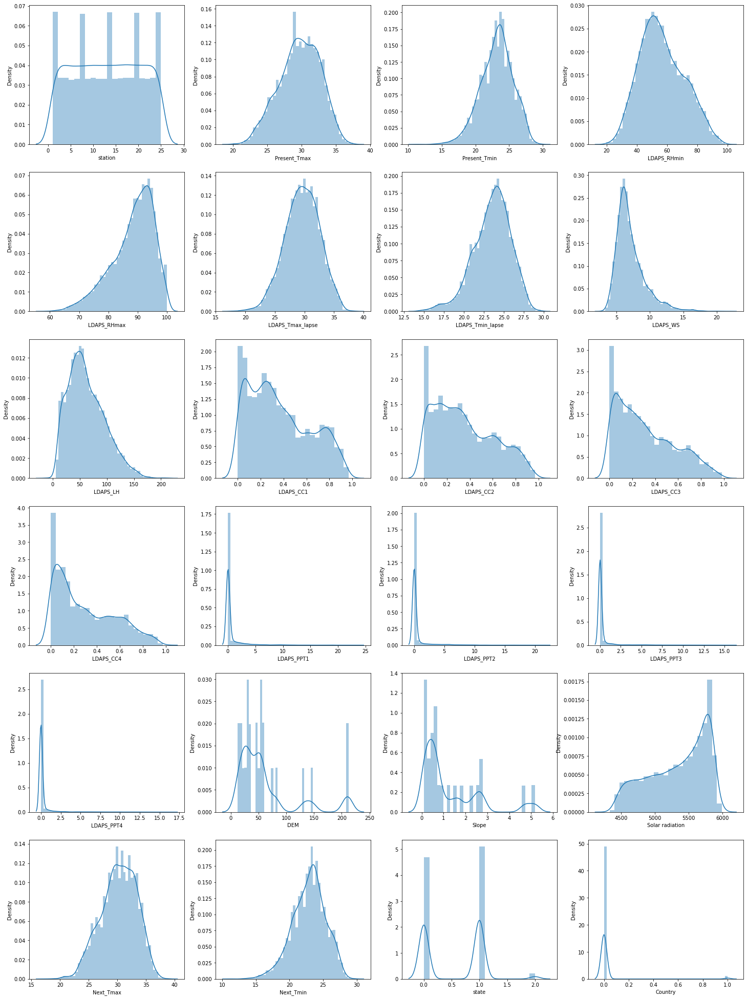

In [24]:
plt.figure(figsize=(25,35))
plotnumber=1

for column in data:
    if plotnumber<=24: #as there are 12 columns in data
        ax=plt.subplot(6,4,plotnumber)
        sns.distplot(data[column])
        plt.xlabel(column,fontsize=10)
    plotnumber +=1
plt.show()

In [25]:
data = data.drop(columns=['station','Country'],axis=1)

In [26]:
data.columns

Index(['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'state'],
      dtype='object')

In [27]:
data.describe()

,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,state
count,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000,7588.000000
mean,29.748366,23.195809,56.724969,88.360823,29.620128,23.511786,7.094097,62.492606,0.368510,0.355528,0.317546,0.298268,0.589008,0.480738,0.275007,0.265373,61.918136,1.259755,5343.724208,30.241526,22.910820,0.551265
std,2.967401,2.400880,14.626559,7.199456,2.943496,2.342579,2.177034,33.686158,0.262260,0.257922,0.249833,0.253392,1.927577,1.743327,1.146087,1.179661,54.323529,1.372748,429.782561,3.111807,2.482256,0.537148
min,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,12.370000,0.098500,4329.520508,17.400000,11.300000,0.000000
25%,27.800000,21.600000,45.960243,84.203724,27.673756,22.086820,5.675358,37.206201,0.146546,0.140324,0.100950,0.081495,0.000000,0.000000,0.000000,0.000000,28.700000,0.271300,5001.485717,28.200000,21.300000,0.000000
50%,29.900000,23.400000,55.023199,89.784122,29.709537,23.758249,6.547838,56.898324,0.315706,0.311676,0.261795,0.227459,0.000000,0.000000,0.000000,0.000000,45.716000,0.618000,5441.987305,30.400000,23.100000,1.000000
75%,32.000000,24.800000,67.115099,93.742725,31.711109,25.155660,8.028960,84.235666,0.574174,0.557164,0.496444,0.498127,0.052594,0.017735,0.007855,0.000017,59.832400,1.767800,5729.485840,32.600000,24.600000,1.000000
max,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,0.968353,0.983789,0.974710,23.701544,21.621661,15.841235,16.655469,212.335000,5.178200,5992.895996,38.900000,29.800000,2.000000


In [28]:
data['LDAPS_PPT4'].unique()

array([0.        , 0.84808154, 1.51387392, ..., 3.57477919, 3.34314185,
       3.09381549])

In [29]:
data['LDAPS_PPT3'].unique()

array([0.        , 0.23700432, 0.25371913, ..., 0.09810387, 0.02972079,
       0.02102984])

In [30]:
#### Continuous columns
['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin']

['Present_Tmax',
 'Present_Tmin',
 'LDAPS_RHmin',
 'LDAPS_RHmax',
 'LDAPS_Tmax_lapse',
 'LDAPS_Tmin_lapse',
 'LDAPS_WS',
 'LDAPS_LH',
 'LDAPS_CC1',
 'LDAPS_CC2',
 'LDAPS_CC3',
 'LDAPS_CC4',
 'DEM',
 'Slope',
 'Solar radiation',
 'Next_Tmax',
 'Next_Tmin']

### Checking outliers

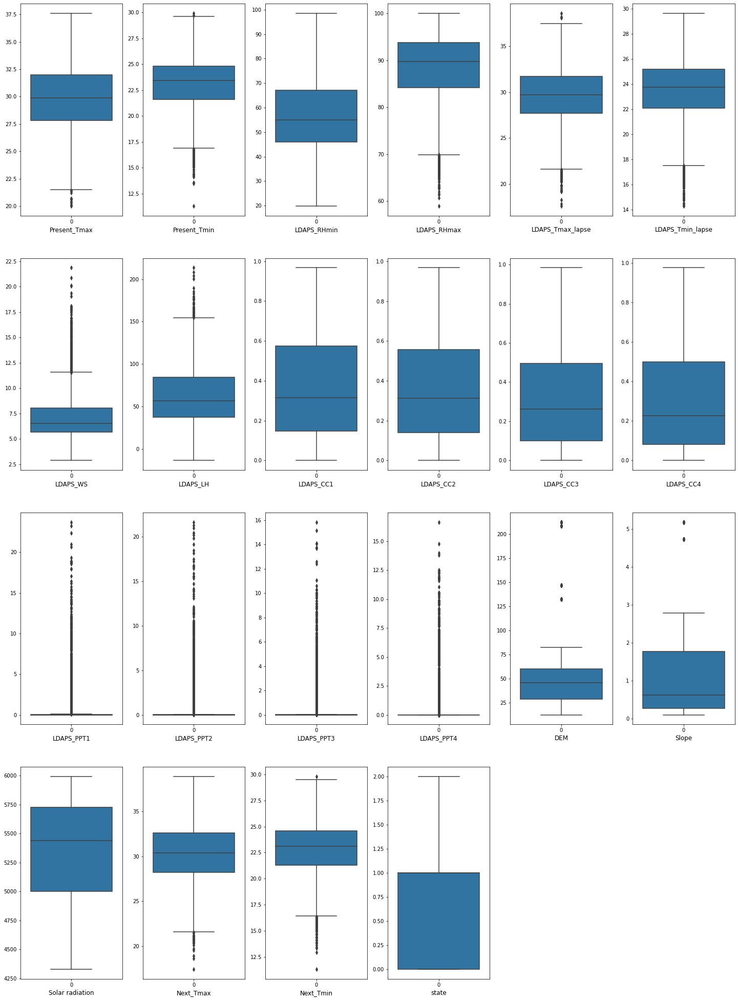

In [31]:
plt.figure(figsize=(25,35))
graph=1

for column in data:
    if graph<=24:
        ax=plt.subplot(4,6,graph)
        sns.boxplot(data=data[column],orient="v")
        plt.xlabel(column,fontsize=12)
    graph+=1
plt.show()

In [32]:
abs(data.corr()['Next_Tmax']).sort_values(ascending=False)

Next_Tmax           1.000000
LDAPS_Tmax_lapse    0.835729
Next_Tmin           0.616629
Present_Tmax        0.610357
LDAPS_Tmin_lapse    0.592119
LDAPS_CC3           0.523061
LDAPS_CC2           0.498295
Present_Tmin        0.463523
LDAPS_CC1           0.459705
LDAPS_CC4           0.454039
LDAPS_RHmin         0.446824
LDAPS_WS            0.351107
LDAPS_RHmax         0.289788
LDAPS_PPT3          0.203554
LDAPS_PPT4          0.190720
LDAPS_PPT2          0.186722
DEM                 0.174578
LDAPS_LH            0.156779
LDAPS_PPT1          0.125954
Slope               0.104279
state               0.085344
Solar radiation     0.016145
Name: Next_Tmax, dtype: float64

In [33]:
abs(data.corr()['Next_Tmin']).sort_values(ascending=False)

Next_Tmin           1.000000
LDAPS_Tmin_lapse    0.886513
Present_Tmin        0.796975
Present_Tmax        0.621048
Next_Tmax           0.616629
LDAPS_Tmax_lapse    0.589963
DEM                 0.249303
Slope               0.148379
state               0.129938
Solar radiation     0.125517
LDAPS_PPT4          0.114900
LDAPS_WS            0.102021
LDAPS_RHmin         0.093249
LDAPS_CC4           0.086197
LDAPS_RHmax         0.076415
LDAPS_PPT3          0.068664
LDAPS_LH            0.060392
LDAPS_CC3           0.056490
LDAPS_CC2           0.030358
LDAPS_PPT1          0.018031
LDAPS_CC1           0.012877
LDAPS_PPT2          0.012462
Name: Next_Tmin, dtype: float64

<AxesSubplot:>

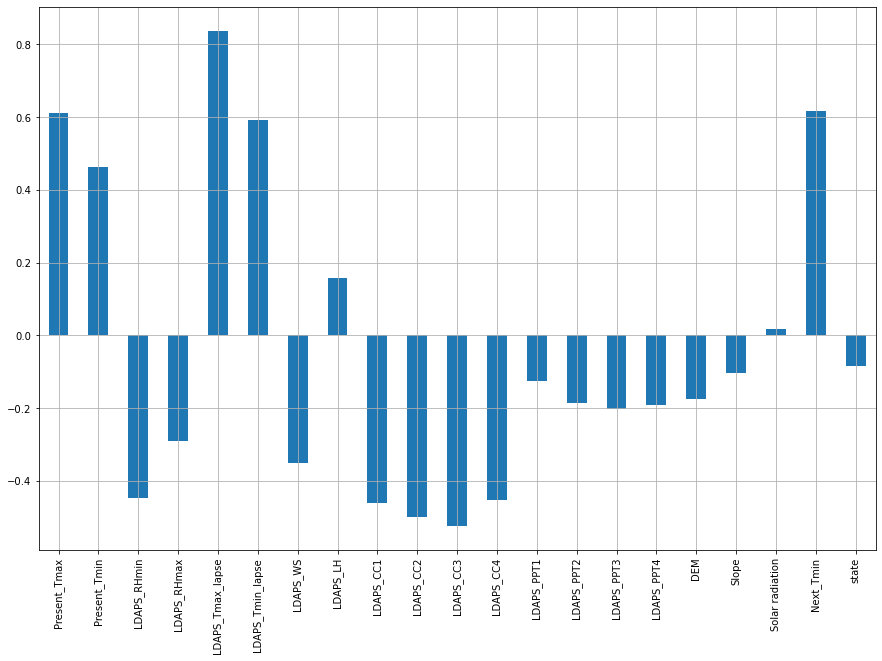

In [34]:
# visualize the correlation
data.drop('Next_Tmax', axis =1).corrwith(data['Next_Tmax']).plot(kind ='bar',grid = True, figsize = (15,10))
                                       

<AxesSubplot:>

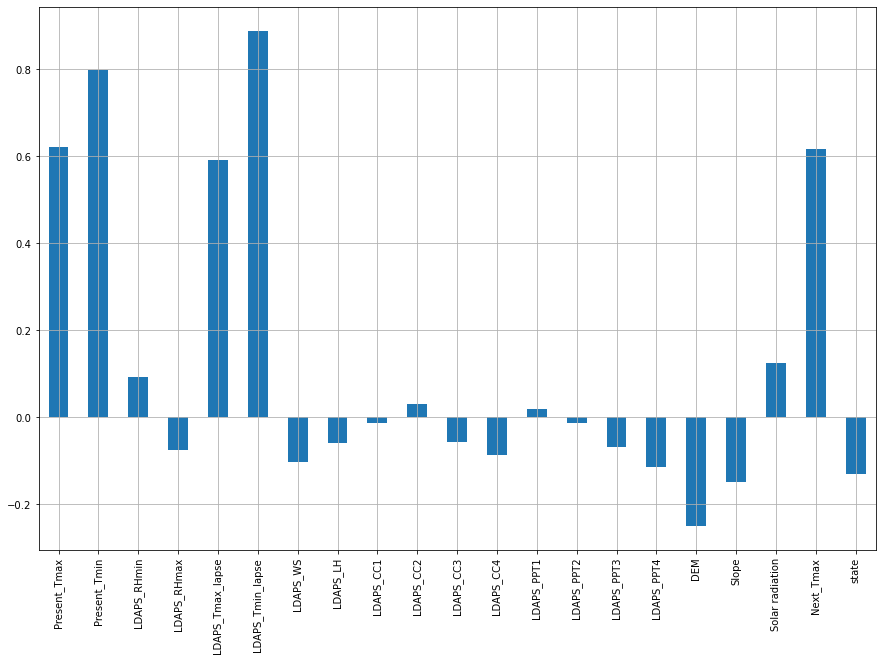

In [35]:
# visualize the correlation
data.drop('Next_Tmin', axis =1).corrwith(data['Next_Tmin']).plot(kind ='bar',grid = True, figsize = (15,10))
                                       

### Removing Outliers

#### Inter quantile range(IQR)

In [36]:
#quantile 1
q1=data.quantile(0.25)
#QUANTILE 3
q3=data.quantile(0.75)

IQR=q3-q1
IQR

Present_Tmax          4.200000
Present_Tmin          3.200000
LDAPS_RHmin          21.154856
LDAPS_RHmax           9.539001
LDAPS_Tmax_lapse      4.037353
LDAPS_Tmin_lapse      3.068840
LDAPS_WS              2.353603
LDAPS_LH             47.029465
LDAPS_CC1             0.427627
LDAPS_CC2             0.416839
LDAPS_CC3             0.395495
LDAPS_CC4             0.416632
LDAPS_PPT1            0.052594
LDAPS_PPT2            0.017735
LDAPS_PPT3            0.007855
LDAPS_PPT4            0.000017
DEM                  31.132400
Slope                 1.496500
Solar radiation     728.000123
Next_Tmax             4.400000
Next_Tmin             3.300000
state                 1.000000
dtype: float64

#### Outfiers detection formula
 higherside==> Q3+(1.5*IQR)
 
 lowerside==>Q3 -(1.5*IQR)

In [37]:
Pt_Tmax=(q3.Present_Tmax-1.5*IQR.Present_Tmax)
print(Pt_Tmax)
index = np.where(data['Present_Tmax']<Pt_Tmax)
data=data.drop(data.index[index])
print(data.shape)
data.reset_index()


25.700000000000003
(6754, 22)


,index,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,LDAPS_CC2,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,state
0,0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,2.038957e-01,1.616969e-01,1.309282e-01,0.000000,0.000000,0.000000,0.000000,212.3350,2.7850,5992.895996,29.1,21.2,1
1,1,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,2.517714e-01,1.594441e-01,1.277273e-01,0.000000,0.000000,0.000000,0.000000,44.7624,0.5141,5869.312500,30.5,22.5,1
2,2,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,2.574694e-01,2.040915e-01,1.421253e-01,0.000000,0.000000,0.000000,0.000000,33.3068,0.2661,5863.555664,31.1,23.9,1
3,3,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,2.260024e-01,1.611574e-01,1.342487e-01,0.000000,0.000000,0.000000,0.000000,45.7160,2.5348,5856.964844,31.7,24.3,1
4,4,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,2.499953e-01,1.788925e-01,1.700210e-01,0.000000,0.000000,0.000000,0.000000,35.0380,0.5055,5859.552246,31.2,22.5,0
5,5,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,0.185279,2.808180e-01,2.328410e-01,1.463629e-01,0.000000,0.000000,0.000000,0.000000,54.6384,0.1457,5873.780762,31.5,24.0,1
6,6,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,0.389600,3.335700e-01,2.704190e-01,1.457054e-01,0.000000,0.000000,0.000000,0.000000,12.3700,0.0985,5849.233398,30.9,23.4,0
7,7,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,0.357856,3.449281e-01,2.723873e-01,1.438406e-01,0.000000,0.000000,0.000000,0.000000,52.5180,1.5629,5863.992188,31.1,22.9,0
8,8,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,0.408766,3.448003e-01,2.649796e-01,1.489111e-01,0.000000,0.000000,0.000000,0.000000,50.9312,0.4125,5876.901367,31.3,21.6,0
9,9,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,0.348292,3.062548e-01,2.452542e-01,1.354435e-01,0.000000,0.000000,0.000000,0.000000,208.5070,5.1782,5893.608398,30.5,21.0,0


In [38]:
data.columns

Index(['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'state'],
      dtype='object')

In [39]:
X = data.drop(columns=['Next_Tmax', 'Next_Tmin'],axis=1)
y1 = data['Next_Tmax']
y2 = data['Next_Tmin']

In [40]:
x =X

### Data Normalization

In [41]:
features = ['Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4','DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin']
from sklearn.preprocessing import power_transform
X=power_transform(X,method='yeo-johnson')
X=pd.DataFrame(X,columns=x.columns)

### Data Standardization

In [42]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
X_scaled=scaler.fit_transform(X)
X=pd.DataFrame(X_scaled,columns=X.columns) 

### Vif for multi colinearity

In [43]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif"]=[variance_inflation_factor(X_scaled,i) for i in range(X_scaled.shape[1])]
vif["Features"]=X.columns

# lets check the vif
vif

,vif,Features
0,11.443385,Present_Tmax
1,47.571322,Present_Tmin
2,63.292039,LDAPS_RHmin
3,17.585197,LDAPS_RHmax
4,49.828840,LDAPS_Tmax_lapse
5,58.082311,LDAPS_Tmin_lapse
6,19.987225,LDAPS_WS
7,53.192628,LDAPS_LH
8,17.033554,LDAPS_CC1
9,19.330707,LDAPS_CC2


#### To remove multicolinearity problem PCA is applied 

### PCA

In [44]:
from sklearn.decomposition import PCA
for i in range(2,19):
    pca = PCA(n_components=i)
    principalComponents = pca.fit_transform(X)
    print(i,sum(pca.explained_variance_ratio_))

2 0.43028856003285115
3 0.5416562975133422
4 0.6183254745697184
5 0.6848355202796987
6 0.7425787501466279
7 0.7927087647927985
8 0.8370865041250133
9 0.8748813968074206
10 0.9043575438191402
11 0.928306691464083
12 0.9416759707356901
13 0.9546931126869218
14 0.9669524866528986
15 0.9767816797321455
16 0.9840671996290474
17 0.9904603437538918
18 0.9946716809335872


### n_components =13

In [45]:
pca = PCA(n_components=13)
principalComponents = pca.fit_transform(X)
X = pd.DataFrame(principalComponents)

In [46]:
X

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,-0.288341,0.744803,-0.025553,0.151167,-0.359089,0.139440,0.109290,0.353240,0.106089,0.045986,-0.000041,-0.091925,-0.060262
1,-0.347492,0.011283,-0.070928,0.241188,-0.242922,0.073277,0.111561,0.336923,0.100616,0.070768,-0.077339,-0.135336,-0.055614
2,-0.363231,-0.240711,-0.031739,0.274248,-0.275305,0.039962,0.149665,0.323863,0.084141,-0.024636,0.065946,-0.130933,-0.035263
3,-0.300809,0.423260,-0.067235,0.183095,-0.194123,0.007628,0.142607,0.301715,0.120067,0.174820,-0.295063,0.056957,0.147635
4,-0.330754,-0.105588,-0.045890,-0.370734,-0.241347,0.101651,0.030557,0.275073,0.059397,0.004785,-0.160570,-0.130259,0.009872
5,-0.326911,-0.206009,-0.011364,0.269297,-0.294535,0.049898,0.125082,0.330959,0.092449,-0.030333,0.005566,-0.322830,-0.155504
6,-0.198531,-0.700425,-0.135122,-0.295480,-0.304848,0.059684,0.034079,0.232867,0.164316,0.050106,0.060938,-0.064326,0.156584
7,-0.221447,0.158959,-0.028279,-0.386908,-0.284797,-0.139678,0.215955,0.171925,0.098143,-0.034258,0.249190,-0.076356,0.149153
8,-0.182337,-0.126773,-0.076010,-0.352097,-0.338673,0.013415,0.088868,0.205694,0.131190,-0.004948,0.207887,-0.240786,-0.043401
9,-0.191573,0.700198,-0.015743,-0.450138,-0.300377,-0.071477,0.158685,0.178533,0.095165,0.003758,0.153647,-0.194493,0.049684


### Model Training(Next_Tmax prediction)
#### Linear regression

In [47]:
from sklearn.linear_model import LinearRegression
lr = LinearRegression()
from sklearn.metrics import r2_score,mean_squared_error
from sklearn.model_selection import train_test_split

In [48]:
for i in range(0,1000):
    x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20,random_state = i)
    lr.fit(x_train,y_train)
    pred_train = lr.predict(x_train) 
    pred_test = lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1) == round(r2_score(y_test,pred_test)*100,1):
        print("At random state",i,"model perform very well")
        print("At random state",i)
        print('Training accuracy score is',r2_score(y_train,pred_train)*100)
        print('Testing accuracy score is',r2_score(y_test,pred_test)*100)

At random state 346 model perform very well
At random state 346
Training accuracy score is 71.84816908878803
Testing accuracy score is 71.84292572401183
At random state 347 model perform very well
At random state 347
Training accuracy score is 71.85328337329157
Testing accuracy score is 71.86649651964106
At random state 404 model perform very well
At random state 404
Training accuracy score is 71.81981148064716
Testing accuracy score is 71.83675879250674
At random state 425 model perform very well
At random state 425
Training accuracy score is 71.8507994831359
Testing accuracy score is 71.87505168712865
At random state 546 model perform very well
At random state 546
Training accuracy score is 71.84956617129797
Testing accuracy score is 71.7619363562656
At random state 581 model perform very well
At random state 581
Training accuracy score is 71.84064015884861
Testing accuracy score is 71.81666416383733
At random state 679 model perform very well
At random state 679
Training accuracy sc

In [57]:
### y2 prediction 
for i in range(0,1000):
    x_train,x_test,y_train,y_test = train_test_split(X,y2,test_size=0.20,random_state = i)
    lr.fit(x_train,y_train)
    pred_train = lr.predict(x_train) 
    pred_test = lr.predict(x_test)
    if round(r2_score(y_train,pred_train)*100,1) == round(r2_score(y_test,pred_test)*100,1):
        print("At random state",i,"model perform very well")
        print("At random state",i)
        print('Training accuracy score is',r2_score(y_train,pred_train)*100)
        print('Testing accuracy score is',r2_score(y_test,pred_test)*100)

At random state 22 model perform very well
At random state 22
Training accuracy score is 76.34110849279931
Testing accuracy score is 76.26940076713666
At random state 149 model perform very well
At random state 149
Training accuracy score is 76.3412405110143
Testing accuracy score is 76.34935039873032
At random state 178 model perform very well
At random state 178
Training accuracy score is 76.32259897124189
Testing accuracy score is 76.31035445480524
At random state 309 model perform very well
At random state 309
Training accuracy score is 76.34251462793361
Testing accuracy score is 76.30264815851106
At random state 328 model perform very well
At random state 328
Training accuracy score is 76.34748572217522
Testing accuracy score is 76.34920333938184
At random state 342 model perform very well
At random state 342
Training accuracy score is 76.34754807009932
Testing accuracy score is 76.3355425163156
At random state 619 model perform very well
At random state 619
Training accuracy scor

### Random_state for y1 = 581
### Random_state for y2 = 949

In [49]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20,random_state=843)

In [61]:
x_train2,x_test2,y_train2,y_test2 = train_test_split(X,y2,test_size=0.20,random_state=949)

In [50]:
from sklearn.metrics import r2_score,mean_absolute_error,mean_squared_error,SCORERS
import scikitplot as skplt

72.56615633412007
1.179606249415661
RMSE : 1.523859950825483


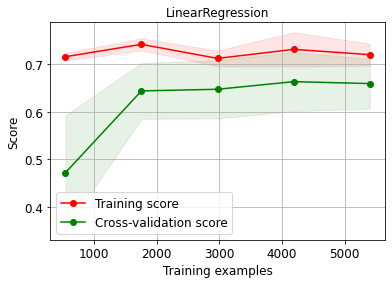

None


In [51]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
lr = LinearRegression()
lr.fit(x_train,y_train)
pred = lr.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(lr,X,y1,cv=5,scoring='r2',text_fontsize='large',title='LinearRegression')
print(plt.show())

76.31408841590289
0.8849170811375416
RMSE : 1.1219553297304152


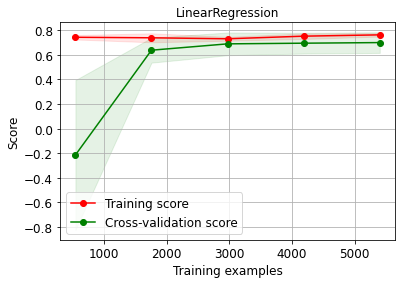

None


In [62]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error
lr = LinearRegression()
lr.fit(x_train2,y_train2)
pred = lr.predict(x_test2)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test2,pred))
mse = mean_squared_error(y_test2,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(lr,X,y2,cv=5,scoring='r2',text_fontsize='large',title='LinearRegression')
print(plt.show())

### Ridge

72.5662355928397
1.1798311234752366
RMSE : 1.5238577495430574


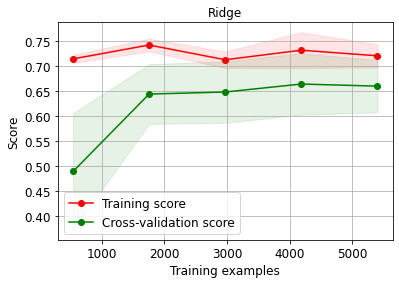

None


In [52]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error
ridge = Ridge()
ridge.fit(x_train,y_train)
pred = ridge.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(ridge,X,y1,cv=5,scoring='r2',text_fontsize='large',title='Ridge')
print(plt.show())

76.32943477000221
0.8846034044868958
RMSE : 1.1215918074413243


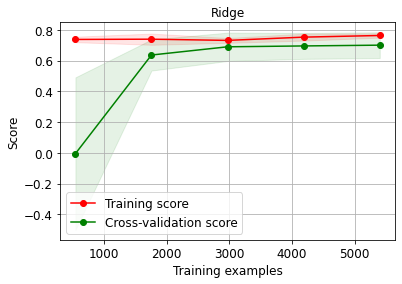

None


In [63]:
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_absolute_error
ridge = Ridge()
ridge.fit(x_train2,y_train2)
pred = ridge.predict(x_test2)
print(r2_score(y_test2,pred)*100)
print(mean_absolute_error(y_test2,pred))
mse = mean_squared_error(y_test2,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(ridge,X,y2,cv=5,scoring='r2',text_fontsize='large',title='Ridge')
print(plt.show())

### Random forest

85.40426653151295
0.8440680977054029
RMSE : 1.111513361425621


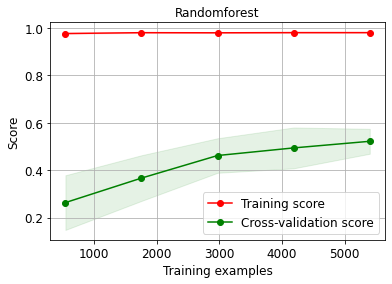

None


In [53]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train,y_train)
pred = rf.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(rf,X,y1,cv=5,scoring='r2',text_fontsize='large',title='Randomforest')
print(plt.show())

83.5071047879669
0.7262028127313099
RMSE : 0.9362222622605868


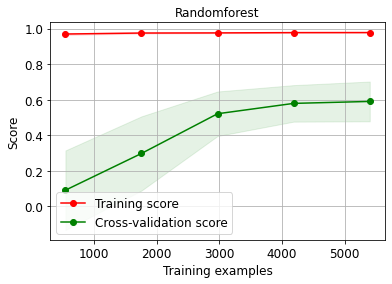

None


In [64]:
from sklearn.ensemble import RandomForestRegressor
rf = RandomForestRegressor()
rf.fit(x_train2,y_train2)
pred = rf.predict(x_test2)
print(r2_score(y_test2,pred)*100)
print(mean_absolute_error(y_test2,pred))
mse = mean_squared_error(y_test2,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(rf,X,y2,cv=5,scoring='r2',text_fontsize='large',title='Randomforest')
print(plt.show())

77.98912701185643
1.0634638046501095
RMSE : 1.3649613667865947


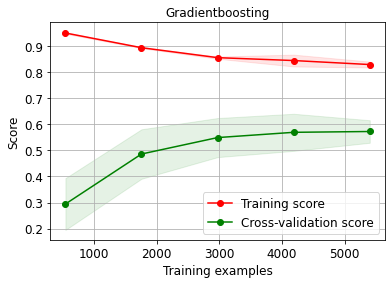

None


In [54]:
from sklearn.ensemble import GradientBoostingRegressor
gb = GradientBoostingRegressor()
gb.fit(x_train,y_train)
pred = gb.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(gb,X,y1,cv=5,scoring='r2',text_fontsize='large',title='Gradientboosting')
print(plt.show())

77.97949173791355
1.063686998148912
RMSE : 1.3652600904608614


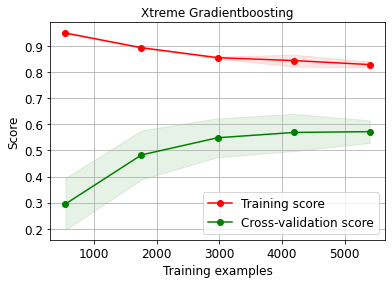

None


In [55]:
from xgboost import XGBRegressor
xgbt = GradientBoostingRegressor()
xgbt.fit(x_train,y_train)
pred = xgbt.predict(x_test)
print(r2_score(y_test,pred)*100)
print(mean_absolute_error(y_test,pred))
mse = mean_squared_error(y_test,pred)
print('RMSE :', np.sqrt(mse))
skplt.estimators.plot_learning_curve(xgbt,X,y1,cv=5,scoring='r2',text_fontsize='large',title='Xtreme Gradientboosting')
print(plt.show())

### Random forest - Hypertuning Gridsearchcv

In [76]:
rf.estimator_params

('criterion',
 'max_depth',
 'min_samples_split',
 'min_samples_leaf',
 'min_weight_fraction_leaf',
 'max_features',
 'max_leaf_nodes',
 'min_impurity_decrease',
 'random_state',
 'ccp_alpha')

In [66]:
from sklearn.model_selection import GridSearchCV
x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=.20,random_state=912)
params = {'n_estimators':range(100,120,10),
        'min_samples_split':range(2,4),
        'min_samples_leaf':range(1,2,1)
        }
GCV2 = GridSearchCV(rf,param_grid = params)
GCV2.fit(x_train,y_train)
print('best_pram', GCV2.best_params_)

rf=GCV2.best_estimator_ #reinstantiating with best params

rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)

print('\nR2score =>','\n',r2_score(y_test,y_pred)*100)
print(mean_absolute_error(y_test,y_pred))
mse = mean_squared_error(y_test,y_pred)
print('RMSE :', np.sqrt(mse))

best_pram {'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 110}

R2score => 
 84.13430398061585
0.851816836013727
RMSE : 1.1401441043873897


### after hyperparameter and cross validation we choose Random forest as our best model

In [67]:
import joblib
joblib.dump(GCV2.best_estimator_,'Temperature prediction next_Tmax2.pkl')

['Temperature prediction next_Tmax2.pkl']

In [68]:
from sklearn.model_selection import GridSearchCV
x_train,x_test,y_train,y_test = train_test_split(X,y2,test_size=.20,random_state=912)
params = {'n_estimators':range(100,120,10),
        'min_samples_split':range(2,4),
        'min_samples_leaf':range(1,2,1)
        }
GCV2 = GridSearchCV(rf,param_grid = params)
GCV2.fit(x_train,y_train)
print('best_pram', GCV2.best_params_)

rf=GCV2.best_estimator_ #reinstantiating with best params

rf.fit(x_train,y_train)
y_pred = rf.predict(x_test)

print('\nR2score =>','\n',r2_score(y_test,y_pred)*100)
print(mean_absolute_error(y_test,y_pred))
mse = mean_squared_error(y_test,y_pred)
print('RMSE :', np.sqrt(mse))

best_pram {'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 110}

R2score => 
 83.95551897747231
0.7099818316398624
RMSE : 0.9224680234311908


In [69]:
import joblib
joblib.dump(GCV2.best_estimator_,'Temperature prediction next_Tmin2.pkl')

['Temperature prediction next_Tmin2.pkl']

In [70]:
model=joblib.load("E:\Datatrained projects\Datatrained-projects\Temperature prediction\Temperature prediction next_Tmin2.pkl")
y_preds=model.predict(x_test)
predicted=pd.DataFrame(y_preds,columns=['predicted'])
predicted

,predicted
0,24.820000
1,25.884545
2,19.248182
3,21.850000
4,23.332727
5,24.360909
6,21.632727
7,26.046364
8,25.939091
9,23.393636


In [71]:
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test = train_test_split(X,y1,test_size=0.20,random_state=843)

In [72]:
model_max=joblib.load("E:\Datatrained projects\Datatrained-projects\Temperature prediction\Temperature prediction next_Tmax2.pkl")
y_preds=model_max.predict(x_test)
predicted_max=pd.DataFrame(y_preds,columns=['predicted'])
predicted_max

,predicted
0,31.805455
1,32.929091
2,28.721818
3,28.013636
4,30.675455
5,29.929091
6,28.605455
7,32.619091
8,29.350000
9,35.273636
